# Capstone Project Luigi Fiori

In [1]:
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.offline import iplot, init_notebook_mode

In [2]:
# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)

In [3]:
import requests 
import pickle
import json
import os
import decimal
import hmac
import time
from datetime import datetime
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
%matplotlib inline
import mplfinance as mpf
import mpl_finance
from mpl_finance import candlestick_ohlc
import matplotlib.dates as mdates
import numpy as np
style.use('ggplot')
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_squared_error
import warnings
import pmdarima as pm

In [4]:
def get_keys(path):
    with open(path) as f:
        return json.load(f)

In [5]:
keys = get_keys("/Users/luigi/.secret/bc_api.json")

api_key = keys['api_key']
secret_key = keys['secret_key']

In [6]:
binance_keys = {
    'api_key': api_key,
    'secret_key': secret_key
}

# Get All Trading(currently) Symbols

In [7]:
#response = requests.get('https://api.binance.com' + '/api/v1/exchangeInfo')
#data_symbols = json.loads(response.text)

#data_symbols['rateLimits'][1]['limit']

In [8]:
def get_trading_symbols():
    
    response = requests.get('https://api.binance.com' + '/api/v1/exchangeInfo')
    data_symbols = json.loads(response.text)
    
    symbols = []

    for x in data_symbols['symbols']:
        if x['status'] == 'TRADING':
            symbols.append(x['symbol'])
            
    return symbols

In [9]:
symbols = get_trading_symbols()

In [10]:
symbols = symbols[:500]

In [11]:
with open('crypto_tickers.pickle', 'wb') as f:
    pickle.dump(symbols, f)

In [12]:
def get_data_from_binance(reload_symbols=False):
    
    if reload_symbols:
        symbols = get_trading_symbols()
    else:
        with open('crypto_tickers.pickle', 'rb') as f:
            symbols = pickle.load(f)
            
    if not os.path.exists('crypto_dfs'):
        os.makedirs('crypto_dfs')
        
    for symbol in symbols:
        
        print(symbol)
        
        if not os.path.exists('crypto_dfs/{}.csv'.format(symbol)):
            
            
            df_crypto = pd.DataFrame()

            for x in range(5):

                if x == 0: 

                    response = requests.get(f'https://api.binance.com/api/v1/klines?symbol={symbol}&interval=1h')
                    data_symbol = json.loads(response.text)

                    # put in dataframe and drop columns we don't neeed
                    df = pd.DataFrame.from_dict(data_symbol)
                    df = df.drop(range(6, 12), axis=1)

                    # rename columns
                    col_names = ['Time', 'Open', 'High', 'Low', 'Close', 'Volume']
                    df.columns = col_names

                    # transform values from strings to floats
                    for col in col_names[1:6]:
                        df[col] = df[col].astype(float)

                    df = df.sort_values(by='Time', ascending=False, kind='quicksort')

                    df_crypto = df_crypto.append(df)

                    timestamp = int(df.loc[0, 'Time'])

                else:

                    response = requests.get(f'https://api.binance.com/api/v1/klines?symbol={symbol}&interval=1h&endTime={timestamp}')
                    data_symbol = json.loads(response.text)

                    # put in dataframe and drop columns we don't neeed
                    df1 = pd.DataFrame.from_dict(data_symbol)
                    df1 = df1.drop(range(6, 12), axis=1)

                            # rename columns
                    col_names = ['Time', 'Open', 'High', 'Low', 'Close', 'Volume']
                    df1.columns = col_names

                    # transform values from strings to floats
                    for col in col_names[1:6]:
                        df1[col] = df1[col].astype(float)

                    df1.drop(df.tail(1).index,inplace=True)

                    df1 = df1.sort_values(by='Time', ascending=False, kind='quicksort')

                    df_crypto = df_crypto.append(df1)

                    df_crypto.reset_index(drop = True, inplace = True)

                    timestamp = int(df1.loc[0, 'Time'])
                    

            df_crypto['Date'] = pd.to_datetime(df_crypto['Time'], unit='ms')
            
            df_crypto.to_csv('crypto_dfs/{}.csv'.format(symbol))
            
        else:
            print('Already have {}'.format(symbol))

In [13]:
get_data_from_binance()

ETHBTC
Already have ETHBTC
LTCBTC
Already have LTCBTC
BNBBTC
Already have BNBBTC
NEOBTC
Already have NEOBTC
QTUMETH
Already have QTUMETH
EOSETH
Already have EOSETH
SNTETH
Already have SNTETH
BNTETH
Already have BNTETH
GASBTC
Already have GASBTC
BNBETH
Already have BNBETH
BTCUSDT
Already have BTCUSDT
ETHUSDT
Already have ETHUSDT
OAXETH
Already have OAXETH
DNTETH
Already have DNTETH
MCOETH
Already have MCOETH
MCOBTC
Already have MCOBTC
WTCBTC
Already have WTCBTC
WTCETH
Already have WTCETH
LRCBTC
Already have LRCBTC
LRCETH
Already have LRCETH
QTUMBTC
Already have QTUMBTC
YOYOBTC
Already have YOYOBTC
OMGBTC
Already have OMGBTC
OMGETH
Already have OMGETH
ZRXBTC
Already have ZRXBTC
ZRXETH
Already have ZRXETH
STRATBTC
Already have STRATBTC
STRATETH
Already have STRATETH
SNGLSBTC
Already have SNGLSBTC
BQXBTC
Already have BQXBTC
BQXETH
Already have BQXETH
KNCBTC
Already have KNCBTC
KNCETH
Already have KNCETH
FUNBTC
Already have FUNBTC
FUNETH
Already have FUNETH
SNMBTC
Already have SNMBTC
SNMETH

Already have ONGBTC
ONGUSDT
Already have ONGUSDT
HOTBNB
Already have HOTBNB
HOTUSDT
Already have HOTUSDT
ZILUSDT
Already have ZILUSDT
ZRXBNB
Already have ZRXBNB
ZRXUSDT
Already have ZRXUSDT
FETBNB
Already have FETBNB
FETBTC
Already have FETBTC
FETUSDT
Already have FETUSDT
BATUSDT
Already have BATUSDT
XMRBNB
Already have XMRBNB
XMRUSDT
Already have XMRUSDT
ZECBNB
Already have ZECBNB
ZECUSDT
Already have ZECUSDT
ZECPAX
Already have ZECPAX
ZECTUSD
Already have ZECTUSD
ZECUSDC
Already have ZECUSDC
IOSTBNB
Already have IOSTBNB
IOSTUSDT
Already have IOSTUSDT
CELRBNB
Already have CELRBNB
CELRBTC
Already have CELRBTC
CELRUSDT
Already have CELRUSDT
ADAPAX
Already have ADAPAX
ADAUSDC
Already have ADAUSDC
NEOPAX
Already have NEOPAX
NEOUSDC
Already have NEOUSDC
DASHBNB
Already have DASHBNB
DASHUSDT
Already have DASHUSDT
NANOUSDT
Already have NANOUSDT
OMGBNB
Already have OMGBNB
OMGUSDT
Already have OMGUSDT
THETAUSDT
Already have THETAUSDT
ENJUSDT
Already have ENJUSDT
MITHUSDT
Already have MITHUSDT


In [14]:
def compile_data():
    with open('crypto_tickers.pickle', 'rb') as f:
        symbols = pickle.load(f)
    
    main_df = pd.DataFrame()
    
    for count, symbol in enumerate(symbols):
        df =pd.read_csv(f'crypto_dfs/{symbol}.csv',  index_col=0)
        df.set_index('Date', inplace=True)
        
        df.rename(columns={'Close' : symbol}, inplace=True)
        df.drop(['Time','Open','High','Low','Volume'], 1, inplace=True)
        
        if main_df.empty:
            main_df = df
            
        else:
            main_df = main_df.join(df)
            
        if count % 10 == 0:
            print(count)
        
            
        
    print(main_df.head())    
        #main_df.set_index('Date', inplace=True)
    main_df.to_csv('500crypto_joined_close.csv')
    return main_df

In [15]:
main_df = compile_data()

0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
                       ETHBTC    LTCBTC    BNBBTC    NEOBTC   QTUMETH  \
Date                                                                    
2020-02-10 15:00:00  0.022652  0.007563  0.002530  0.001364  0.011631   
2020-02-10 14:00:00  0.022596  0.007530  0.002514  0.001364  0.011596   
2020-02-10 13:00:00  0.022359  0.007480  0.002537  0.001362  0.011615   
2020-02-10 12:00:00  0.022343  0.007504  0.002514  0.001359  0.011685   
2020-02-10 11:00:00  0.022256  0.007457  0.002490  0.001357  0.011656   

                       EOSETH    SNTETH    BNTETH    GASBTC    BNBETH  \
Date                                                                    
2020-02-10 15:00:00  0.021880  0.000074  0.001383  0.000158  0.111699   
2020-02-10 14:00:00  0.022017  0.000074  0.001380  0.000159  0.111391   
2020-02

In [16]:
main_df.head()

,ETHBTC,LTCBTC,BNBBTC,NEOBTC,QTUMETH,EOSETH,SNTETH,BNTETH,GASBTC,BNBETH,...,DOCKUSDT,WANUSDT,FUNUSDT,CVCUSDT,BTTTRX,WINTRX,CHZBNB,CHZBTC,CHZUSDT,BANDBNB
Date,,,,,,,,,,,,,,,,,,,,,
2020-02-10 15:00:00,0.022652,0.007563,0.002530,0.001364,0.011631,0.021880,0.000074,0.001383,0.000158,0.111699,...,0.008668,0.2974,0.003928,0.03012,0.02065,0.00541,0.000407,0.000001,0.010240,0.01364
2020-02-10 14:00:00,0.022596,0.007530,0.002514,0.001364,0.011596,0.022017,0.000074,0.001380,0.000159,0.111391,...,0.008619,0.2953,0.003891,0.02963,0.02077,0.00546,0.000408,0.000001,0.010126,0.01389
2020-02-10 13:00:00,0.022359,0.007480,0.002537,0.001362,0.011615,0.022002,0.000075,0.001388,0.000156,0.113481,...,0.008519,0.2938,0.003833,0.02947,0.02084,0.00550,0.000402,0.000001,0.009932,0.01377
2020-02-10 12:00:00,0.022343,0.007504,0.002514,0.001359,0.011685,0.021915,0.000075,0.001390,0.000155,0.112483,...,0.008538,0.2940,0.003835,0.02924,0.02089,0.00548,0.000400,0.000001,0.009922,0.01387
2020-02-10 11:00:00,0.022256,0.007457,0.002490,0.001357,0.011656,0.021900,0.000075,0.001391,0.000157,0.111846,...,0.008507,0.2890,0.003817,0.02897,0.02082,0.00547,0.000406,0.000001,0.009917,0.01389


In [17]:
main_df.duplicated().any()

False

# Find Relationship with different Cryptocurrencies

In [28]:
df = pd.read_csv('500crypto_joined_close.csv')
corrs = df.corr()
corrs

,ETHBTC,LTCBTC,BNBBTC,NEOBTC,QTUMETH,EOSETH,SNTETH,BNTETH,GASBTC,BNBETH,...,DOCKUSDT,WANUSDT,FUNUSDT,CVCUSDT,BTTTRX,WINTRX,CHZBNB,CHZBTC,CHZUSDT,BANDBNB
ETHBTC,1.000000,0.762170,0.890767,0.595853,-0.589773,-0.292213,0.235963,-0.166582,0.721040,0.071187,...,0.609533,0.738693,0.519843,0.732661,0.311236,0.339396,0.332685,0.541559,0.659071,-0.158972
LTCBTC,0.762170,1.000000,0.606105,0.563975,-0.505293,0.317209,-0.080090,-0.618201,0.405624,-0.105524,...,0.265841,0.799047,0.203148,0.535577,0.129932,-0.000854,-0.146248,0.076358,0.352551,-0.595954
BNBBTC,0.890767,0.606105,1.000000,0.580645,-0.527549,-0.408803,0.206692,0.003832,0.853785,0.516075,...,0.777042,0.595271,0.564298,0.859751,0.502648,0.600974,0.476901,0.699196,0.823112,-0.104517
NEOBTC,0.595853,0.563975,0.580645,1.000000,-0.367825,0.019106,-0.132009,-0.272187,0.331667,0.141026,...,0.099864,0.436843,0.211299,0.290121,0.178830,0.174959,0.069004,0.247265,0.306910,-0.374265
QTUMETH,-0.589773,-0.505293,-0.527549,-0.367825,1.000000,0.096518,0.255638,0.372524,-0.284344,-0.047772,...,-0.284948,-0.292021,0.037156,-0.424503,-0.221993,-0.191234,-0.122685,-0.270324,-0.346779,0.352681
EOSETH,-0.292213,0.317209,-0.408803,0.019106,0.096518,1.000000,-0.545290,-0.748122,-0.574870,-0.345594,...,-0.600902,0.062321,-0.415307,-0.436064,-0.351254,-0.692986,-0.850072,-0.808719,-0.593768,-0.665814
SNTETH,0.235963,-0.080090,0.206692,-0.132009,0.255638,-0.545290,1.000000,0.577265,0.453123,0.015692,...,0.455495,0.354687,0.384664,0.341083,0.135665,0.346949,0.562692,0.501134,0.429166,0.548146
BNTETH,-0.166582,-0.618201,0.003832,-0.272187,0.372524,-0.748122,0.577265,1.000000,0.268464,0.325522,...,0.322479,-0.299264,0.321070,0.101510,0.181009,0.505726,0.679959,0.543887,0.298572,0.810557
GASBTC,0.721040,0.405624,0.853785,0.331667,-0.284344,-0.574870,0.453123,0.268464,1.000000,0.518300,...,0.892648,0.578738,0.580307,0.931518,0.599968,0.770492,0.603031,0.754803,0.869768,0.092785
BNBETH,0.071187,-0.105524,0.516075,0.141026,-0.047772,-0.345594,0.015692,0.325522,0.518300,1.000000,...,0.564653,-0.078497,0.259377,0.511885,0.525864,0.678328,0.420144,0.513815,0.568273,0.068889


In [34]:
corrs.index

Index(['ETHBTC', 'LTCBTC', 'BNBBTC', 'NEOBTC', 'QTUMETH', 'EOSETH', 'SNTETH',
       'BNTETH', 'GASBTC', 'BNBETH',
       ...
       'DOCKUSDT', 'WANUSDT', 'FUNUSDT', 'CVCUSDT', 'BTTTRX', 'WINTRX',
       'CHZBNB', 'CHZBTC', 'CHZUSDT', 'BANDBNB'],
      dtype='object', length=500)

In [47]:
def visualize_data():
    df = pd.read_csv('500crypto_joined_close.csv')
    corrs = df.corr()

    fig = go.Figure(data=go.Heatmap(
                    z=corrs.values,
                    x=list(corrs.columns),
                    y=list(corrs.index),
                    showscale=True,
                    colorscale='Inferno',
                    hoverongaps = False))
    fig.show()

In [48]:
visualize_data()

In [20]:
main_df['ETHBTC'].head()

Date
2020-02-10 15:00:00    0.022652
2020-02-10 14:00:00    0.022596
2020-02-10 13:00:00    0.022359
2020-02-10 12:00:00    0.022343
2020-02-10 11:00:00    0.022256
Name: ETHBTC, dtype: float64

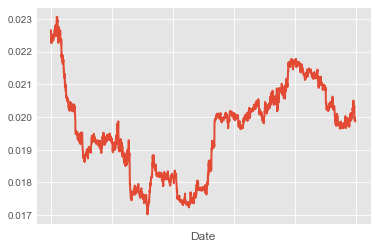

In [21]:
main_df['ETHBTC'].plot()
plt.show()

In [22]:
main_df['ETHBTC'].iplot()

In [23]:
main_df['ETHBTC'].iplot(kind='hist', xTitle='Time',
                  yTitle='Price', title='Hourly ETHBTC Close')

In [24]:
main_df['ETHBTC'].head()

Date
2020-02-10 15:00:00    0.022652
2020-02-10 14:00:00    0.022596
2020-02-10 13:00:00    0.022359
2020-02-10 12:00:00    0.022343
2020-02-10 11:00:00    0.022256
Name: ETHBTC, dtype: float64

In [25]:
main_df['ETHBTC'].iplot(mode='lines+text',
                        xTitle='Time',
                        yTitle='Price', 
                        title='Hourly ETHBTC Close',
            
                        opacity=0.8)

# Preprocess data for Machine Learning

Through our heatmap we saw that there's correlation in terms of price between different cryptocurrencies.

The question is, can we get a Machine to recognize those relationship?

Can we take in account tthe movement of all the companies and get an edge doing it?

In [56]:
def process_data_for_labels(symbol):
    days = 3
    df = pd.read_csv('500crypto_joined_close.csv', index_col=0)
    symbols = df.columns.values.tolist()
    df.fillna(0, inplace=True)
    
    for i in range(1, days+1):
        df[f'{symbol}_{i}day'] = (df[symbol].shift(-i) - df[symbol]) / df[symbol]
        
    df.fillna(0, inplace=True)
    
    return symbols, df

In [57]:
process_data_for_labels('ETHBTC')

## Get trading data for 1 symbol

In [ ]:
df_crypto = pd.DataFrame()

for x in range(5):
    
    if x == 0: 
    
        response = requests.get('https://api.binance.com/api/v1/klines?symbol=BTCUSDT&interval=1h')
        data_symbol = json.loads(response.text)

        # put in dataframe and drop columns we don't neeed
        df = pd.DataFrame.from_dict(data_symbol)
        df = df.drop(range(6, 12), axis=1)

        # rename columns
        col_names = ['Time', 'Open', 'High', 'Low', 'Close', 'Volume']
        df.columns = col_names

        # transform values from strings to floats
        for col in col_names[1:6]:
            df[col] = df[col].astype(float)
            
        df = df.sort_values(by='Time', ascending=False, kind='quicksort')
            
        df_crypto = df_crypto.append(df)
        
        timestamp = int(df.loc[0, 'Time'])
            
    else:
        
        response = requests.get(f'https://api.binance.com/api/v1/klines?symbol=BTCUSDT&interval=1h&endTime={timestamp}')
        data_symbol = json.loads(response.text)
        
        # put in dataframe and drop columns we don't neeed
        df1 = pd.DataFrame.from_dict(data_symbol)
        df1 = df1.drop(range(6, 12), axis=1)
        
                # rename columns
        col_names = ['Time', 'Open', 'High', 'Low', 'Close', 'Volume']
        df1.columns = col_names
        
        # transform values from strings to floats
        for col in col_names[1:6]:
            df1[col] = df1[col].astype(float)
            
        df1.drop(499, inplace=True)
        
        df1 = df1.sort_values(by='Time', ascending=False, kind='quicksort')
        
        df_crypto = df_crypto.append(df1)
        
        df_crypto.reset_index(drop = True, inplace = True)
        
        #df_crypto['Date'] = pd.to_datetime(df1['Time'], unit='ms')
        
        timestamp = int(df1.loc[0, 'Time'])
        
df_crypto['Date'] = pd.to_datetime(df_crypto['Time'], unit='ms')

In [ ]:
df_crypto

In [ ]:
df_crypto.duplicated().any()

In [ ]:
if not os.path.exists('btc_df.csv'):
    df_crypto.to_csv('btc_df.csv')

In [ ]:
df_crypto.drop(columns='Time', axis=1, inplace=True)

In [ ]:
df_crypto.head()

In [ ]:
df_crypto = df_crypto.set_index('Date')

In [ ]:
df_crypto = df_crypto.sort_index()

In [ ]:
df_crypto.head()

In [ ]:
plt.figure(figsize=(20,10))
df_crypto['Close'].plot(kind='line');

In [ ]:
#plt.figure(figsize=(20,10))
#df_crypto.set_index('Date')['Close'].plot(kind='line');

In [ ]:
#def get_timestamp_ms(d, m, y):
#    s = f"{d}/{m}/{y}"
#    x  = time.mktime(datetime.strptime(s, "%d/%m/%Y").timetuple())
#    timestamp = (x * 1000) + 18000000
#    return int(timestamp)

# ARIMA

In [ ]:
def evaluate_arima_model(X, arima_order):
    '''
    evaluate an ARIMA model for a given order (p,d,q)
    '''
    # prepare training dataset
    train_size = int(len(X) * 0.66)
    train, test = X[0:train_size], X[train_size:]
    history = [x for x in train]
    # make predictions
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit(disp=0)
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])
    # calculate out of sample error
    error = mean_squared_error(test, predictions)
    return error
 
def evaluate_models(dataset, p_values, d_values, q_values):
    '''
     evaluate combinations of p, d and q values for an ARIMA model
    '''
    dataset = dataset.astype('float32')
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    mse = evaluate_arima_model(dataset, order)
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.3f' % (order,mse))
                except:
                    continue
    print('Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))
    return best_cfg

In [ ]:
timeseries = df_crypto.groupby('Date')['Close'].mean()
timeseries.head()

In [ ]:
## evaluate parameters
#p_values = [0, 1, 2]
#d_values = range(0, 2)
#q_values = range(0, 2)
#warnings.filterwarnings("ignore")
#order = evaluate_models(timeseries.values, p_values, d_values, q_values)
#
#model= ARIMA(timeseries, order=order)
#model_fit= model.fit(disp=False)
#three_hours = model_fit.forecast(steps=3)

In [ ]:
model = ARIMA(timeseries, order = (0,1,0))
model_fit = model.fit()
print(model_fit.summary())

In [ ]:
forecast = model_fit.forecast(steps=72)

# random walh 0,1,0
past points don't affect present

In [ ]:
model_fit.plot_predict();

In [ ]:
def arimamodel(timeseries):
    automodel = pm.auto_arima(timeseries, 
                              start_p=1, 
                              start_q=1,
                              test="adf",
                              seasonal=False,
                              trace=True)
    return automodel

In [ ]:
def plotarima(n_periods, timeseries, automodel):
    # Forecast
    #fc, confint = automodel.predict(n_periods=n_periods, 
     #                               return_conf_int=True)
    # Weekly index
    fc_ind = pd.date_range(timeseries.index[timeseries.shape[0]-1], 
                           periods=n_periods, freq="h")
    # Forecast series
    fc_series = pd.Series(forecast[0], index=fc_ind)
    # Upper and lower confidence bounds
    lower_series = pd.Series(forecast[2][:,0], index=fc_ind)
    upper_series = pd.Series(forecast[2][:,1], index=fc_ind)
    # Create plot
    plt.figure(figsize=(20,10))
    plt.plot(timeseries)
    plt.plot(fc_series, color="blue")
    plt.xlabel("date")
    plt.ylabel(timeseries.name)
    plt.fill_between(lower_series.index, 
                     lower_series, 
                     upper_series, 
                     color="k", 
                     alpha=0.25)
    plt.legend(("past", "forecast", "95% confidence interval"),  
               loc="upper left")
    plt.show();

In [ ]:
automodel = arimamodel(timeseries)

### In statistics, the Bayesian information criterion (BIC) or Schwarz information criterion (also SIC, SBC, SBIC) is a criterion for model selection among a finite set of models; the model with the lowest BIC is preferred.

In [ ]:
automodel.summary()

In [ ]:
plotarima(72, timeseries, automodel);

In [ ]:
#def plotarima(n_periods, timeseries, automodel):
#    # Forecast
#    fc, confint = automodel.predict(n_periods=n_periods, 
#                                    return_conf_int=True)
#    # Hourly index
#    fc_ind = pd.date_range(timeseries.index[timeseries.shape[0]-1], 
#                           periods=n_periods, freq="h")
#    # Forecast series
#    fc_series = pd.Series(fc, index=fc_ind)
#    # Upper and lower confidence bounds
#    lower_series = pd.Series(confint[:, 0], index=fc_ind)
#    upper_series = pd.Series(confint[:, 1], index=fc_ind)
#    # Create plot
#    plt.figure(figsize=(10, 6))
#    plt.plot(timeseries)
#    plt.plot(fc_series, color="red")
#    plt.xlabel("date")
#    plt.ylabel(timeseries.name)
#    plt.fill_between(lower_series.index, 
#                     lower_series, 
#                     upper_series, 
#                     color="k", 
#                     alpha=0.25)
#    plt.legend(("past", "forecast", "95% confidence interval"),  
#               loc="upper left")
#    plt.show()
#    plt.close()

# MOVING AVG

In [ ]:
df_crypto.duplicated().any()

In [ ]:
#new_df['100ma'] = new_df['close'].rolling(window=100, min_periods=0).mean()
#new_df.tail()

In [ ]:
plt.figure(figsize=(20,10))
ax1 = plt.subplot2grid((6, 1), (0, 0), rowspan=5, colspan=1)
ax2 = plt.subplot2grid((6, 1), (5, 0), rowspan=1, colspan=1, sharex=ax1)

ax1.plot(df_crypto.index, df_crypto['Close'])
#ax1.plot(new_df.index, new_df['100ma'])
#ax2.bar(df_crypto.index, df_crypto['Volume'])

plt.show()

In [ ]:
#df_ohlc = new_df['close'].resample('1d').ohlc()
#df_ohlc

In [ ]:
df_ohlc = df_crypto['Close'].resample('1d').ohlc()
df_volume = df_crypto['Volume'].resample('1d').sum()
df_ohlc.head()

In [ ]:
df_ohlc.index = df_ohlc.index.map(mdates.date2num)
df_ohlc.head()

In [ ]:
df_ohlc.reset_index(inplace=True)
df_ohlc.head()

In [ ]:
df_ohlc.columns = [['Date', 'Open', 'High', 'Low', 'Close']]
df_ohlc.head()

In [ ]:
plt.figure(figsize=(20,10))
ax = plt.subplot()
ax.plot(df_crypto['Close'].rolling(window=100).mean(), color='b',  label='100MA')
candlestick_ohlc(ax, df_ohlc.values, width=2, colorup='g', colordown='r')
ax.grid(True)
ax.set_axisbelow(True)
ax.set_title('BTC Share Price', color='white', fontsize=27)
ax.set_facecolor('black')
ax.figure.set_facecolor('#121212')
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
ax.xaxis_date()

In [ ]:
plt.figure(figsize=(20,10))
ax1 = plt.subplot2grid((6, 1), (0, 0), rowspan=5, colspan=1)
ax2 = plt.subplot2grid((6, 1), (5, 0), rowspan=1, colspan=1, sharex=ax1)



candlestick_ohlc(ax1, df_ohlc.values, width=2, colorup='g', colordown='r')
ax1.grid(True)
ax1.set_axisbelow(True)
ax1.set_title('BTC Share Price', color='white', fontsize=27)
ax1.set_facecolor('black')
ax1.figure.set_facecolor('#121212')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
ax1.axes.get_xaxis().set_visible(False)
ax1.set_ylabel('Price', fontsize = 20) 

ax1.plot(df_crypto['Close'].rolling(window=100).mean(), color='b',  label='100MA')
ax1.legend(loc="upper right", fontsize=15)

plt.xticks(rotation=45,fontsize=15)
plt.yticks(fontsize=15)
ax1.xaxis_date()


ax2.fill_between(df_volume.index.map(mdates.date2num), df_volume.values, 0, color = 'magenta',  label='Volume')
ax2.set_ylabel('Volume', fontsize = 20) 
ax2.tick_params(axis='x', colors='white')
ax2.tick_params(axis='y', colors='white')
ax2.grid(True)
ax2.set_facecolor('black')
ax2.legend(loc="upper right", fontsize=15)
plt.legend()
plt.show()


In [ ]:
#mpf.plot(df_ohlc,type='candle')

In [ ]:
df_volume.shape

In [ ]:
df_ohlc.shape

In [ ]:
#df_ohlc.index = df_ohlc.index.map(mdates.date2num)
#df_ohlc.head()

In [ ]:
df_ohlc.index.name = 'date'
df_ohlc.head()

In [ ]:
mpf.plot(new_df,type='candle')